**<center><h2> Urban Sound Classification</h2></center>**

In [ ]:
%matplotlib inline
%load_ext tensorboard
!rm -rf ./logs/
import tensorflow as tf
import datetime
import tensorflow.keras
from tensorflow.keras.layers import Activation, Dense, Dropout, Conv2D,Flatten, MaxPooling2D
from tensorflow.keras.models import Sequential
import librosa
import librosa.display
import numpy as np
import h5py
import os
import pickle
import pandas as pd
import IPython.display as ipd
import random
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!wget --header="Host: zenodo.org" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/81.0.4044.129 Safari/537.36 Edg/81.0.416.68" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Cookie: session=d05e7062d83c6960_5eae5eee._VO93a_dOpQLrVVDo4tLhmdetWA" --header="Connection: keep-alive" "https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz" -c -O 'UrbanSound8K.tar.gz'
!tar -xf UrbanSound8K.tar.gz

--2020-06-16 05:46:21--  https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz
Resolving zenodo.org (zenodo.org)... 188.184.117.155
Connecting to zenodo.org (zenodo.org)|188.184.117.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6023741708 (5.6G) [application/octet-stream]
Saving to: ‘UrbanSound8K.tar.gz’

UrbanSound8K.tar.gz 100%[===================>]   5.61G  11.3MB/s    in 6m 49s  

2020-06-16 05:53:11 (14.0 MB/s) - ‘UrbanSound8K.tar.gz’ saved [6023741708/6023741708]



In [ ]:
# Read Data
data = pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')

In [ ]:
data.shape

(8732, 8)

In [ ]:
# Get data over 3 seconds long
valid_data = data[['slice_file_name', 'fold' ,'classID', 'class']][ data['end']-data['start'] >= 3 ]
valid_data.shape

(7468, 4)

In [ ]:
valid_data['class'].unique()

array(['children_playing', 'dog_bark', 'air_conditioner', 'street_music',
       'siren', 'engine_idling', 'jackhammer', 'drilling', 'gun_shot',
       'car_horn'], dtype=object)

In [ ]:
valid_data[valid_data['class'] == 'car_horn' ][:2]

,slice_file_name,fold,classID,class
1203,128465-1-0-0.wav,6,1,car_horn
1204,128465-1-0-1.wav,6,1,car_horn


<h4>An Example of Car Horn Sound with It's Waveplot And Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold6/128465-1-0-0.wav')

<h4>Waveplot</h4>

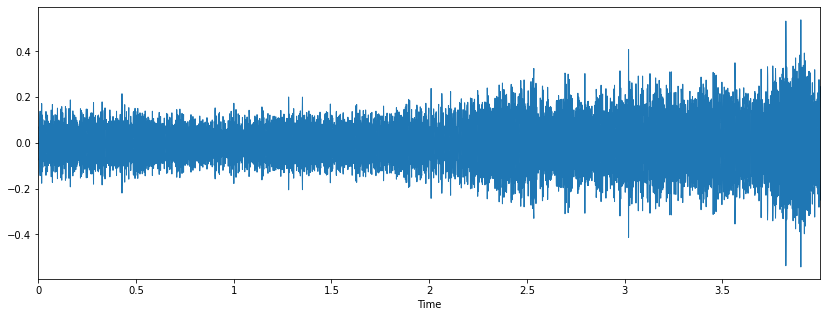

In [ ]:
# Example of a Wave Plot
x, sr = librosa.load('UrbanSound8K/audio/fold6/128465-1-0-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

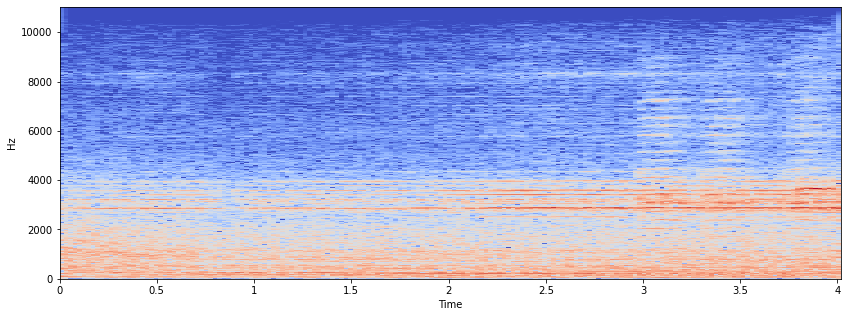

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

<h4>An Example of Jackhammer Sound with It's Waveplot And Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold1/103074-7-0-0.wav')

<h4>Waveplot</h4>

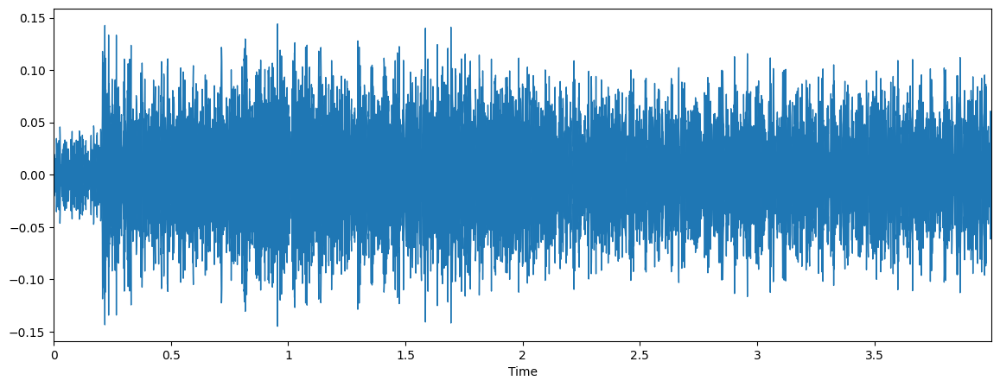

In [ ]:
# Example of a Wave Plot
x, sr = librosa.load('UrbanSound8K/audio/fold1/103074-7-0-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

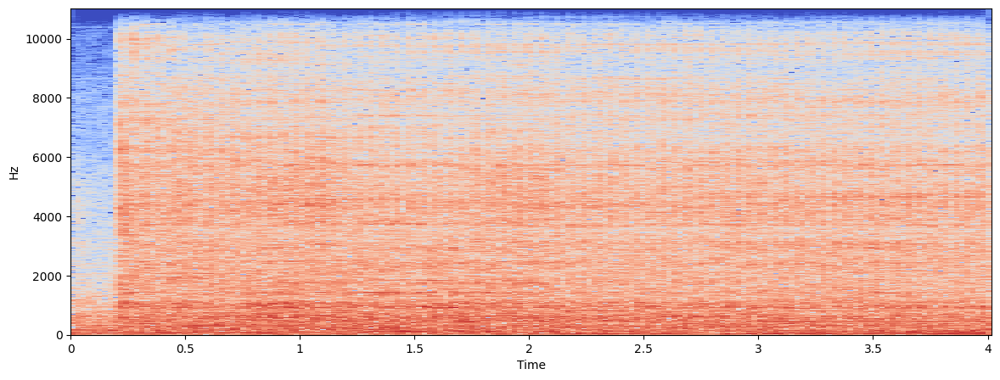

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

<h4>An Example of Gun Shot Sound with It's Waveplot And Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold1/122690-6-0-0.wav')

<h4>Waveplot</h4>

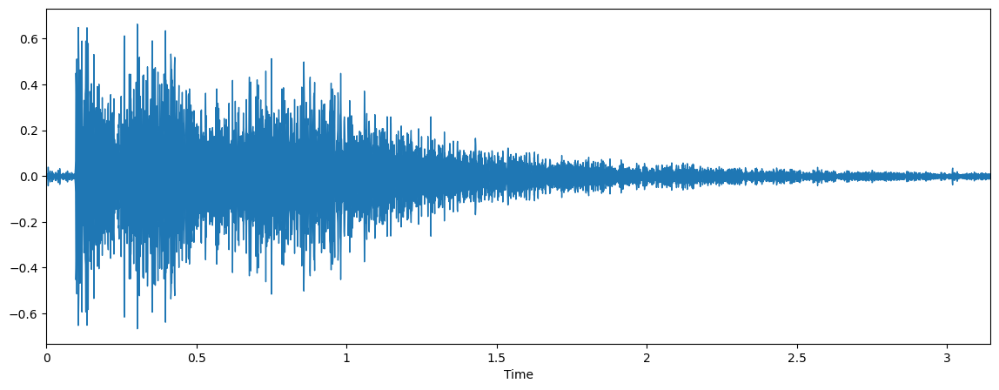

In [ ]:
# Example of a Wave Plot
x, sr = librosa.load('UrbanSound8K/audio/fold1/122690-6-0-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram<h4>

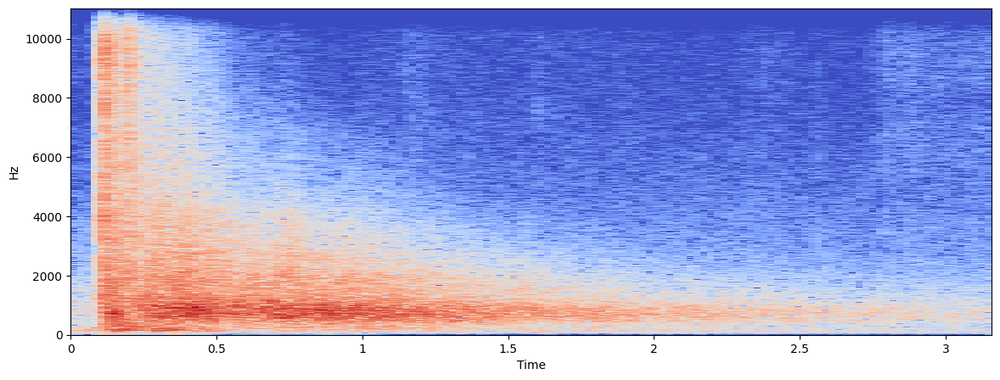

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

<h4>An Example of Dog Bark Sound with It's Waveplot And Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold10/100795-3-1-0.wav')

<h4>Waveplot</h4>

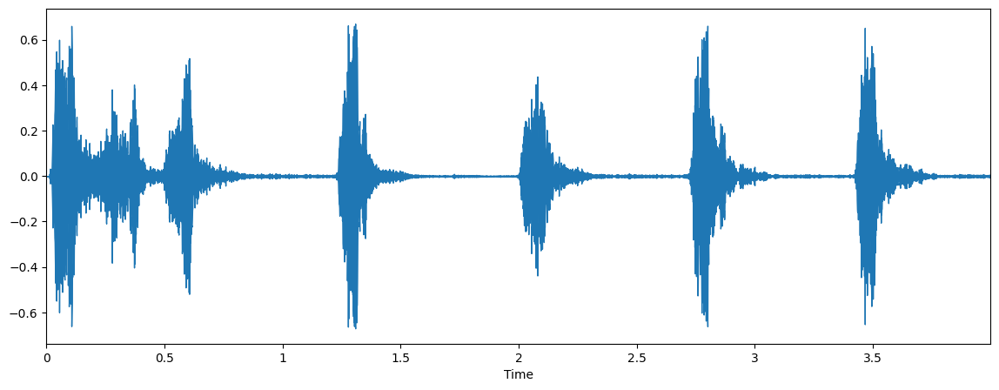

In [ ]:
# Example of a Wave Plot
x, sr = librosa.load('UrbanSound8K/audio/fold10/100795-3-1-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

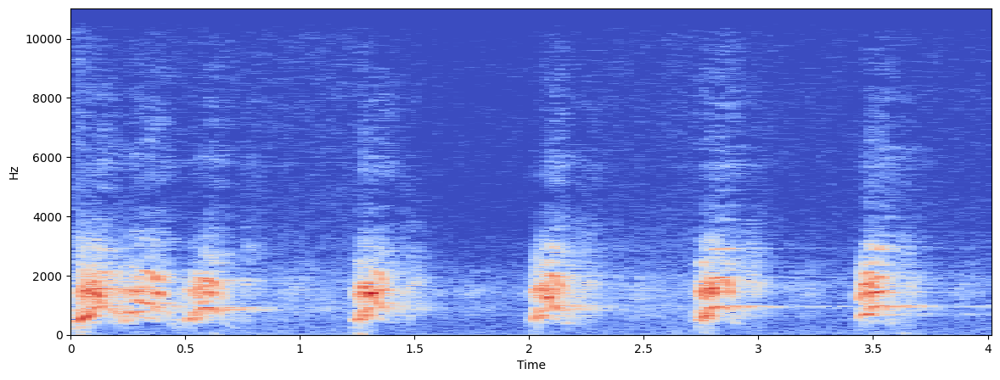

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

<h4>An Example of Siren Sound with It's Waveplot And Spectrogram

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold6/135160-8-0-0.wav')

<h4>WavePlot</h4>

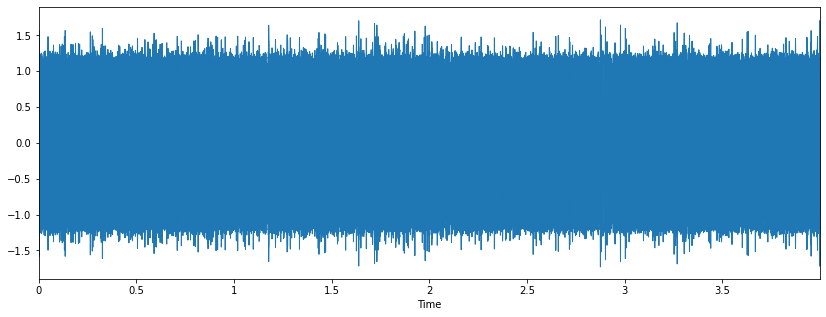

In [ ]:
# Example of a Wave Plot
x, sr = librosa.load('UrbanSound8K/audio/fold6/135160-8-0-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

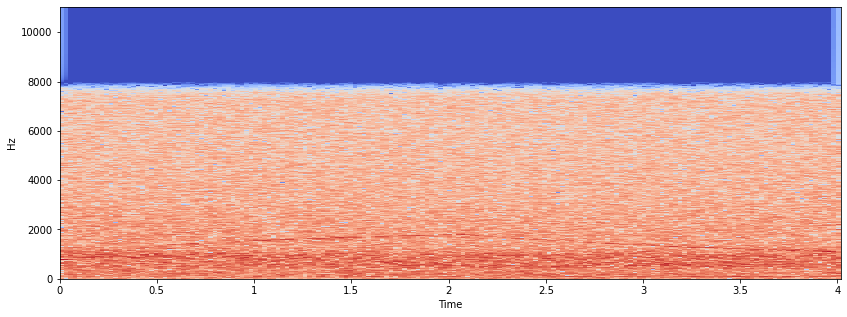

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

An Example of an AC Sound With It's Waveplot And Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold1/134717-0-0-19.wav')

<h4>WavePlot</h4>

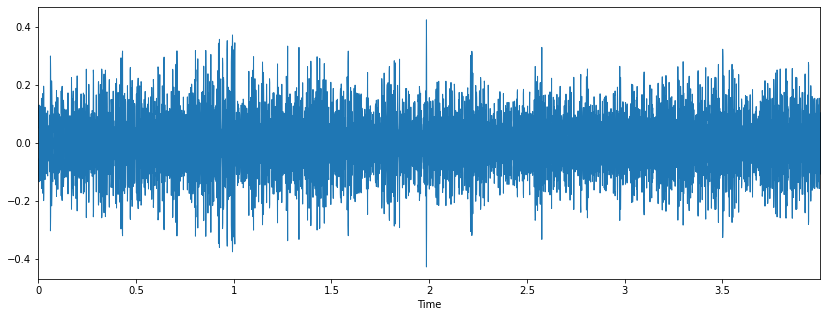

In [ ]:
x, sr = librosa.load('UrbanSound8K/audio/fold1/134717-0-0-19.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

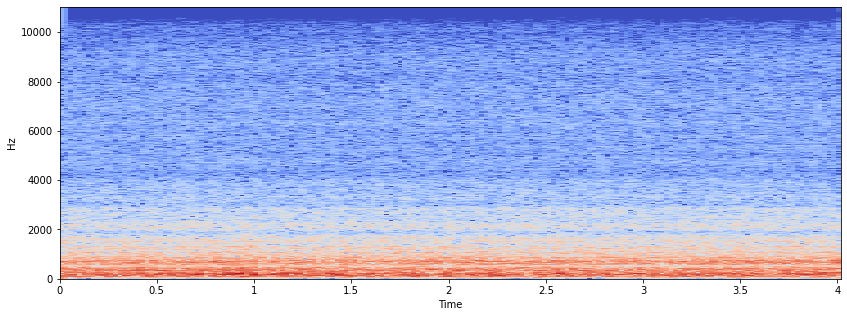

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

An Example of Childern Playing Sound With it's WavePlot and Spectrogram</h4>

In [ ]:
# Example of a children playing spectrogram
ipd.Audio('UrbanSound8K/audio/fold9/13579-2-0-16.wav')

<h4>Waveplot</h4>

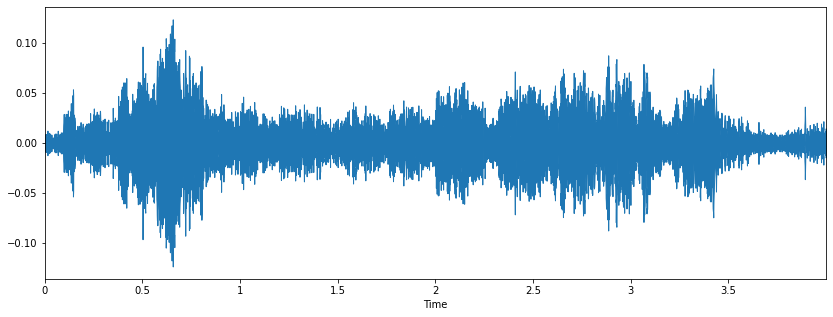

In [ ]:
x, sr = librosa.load('UrbanSound8K/audio/fold9/13579-2-0-16.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

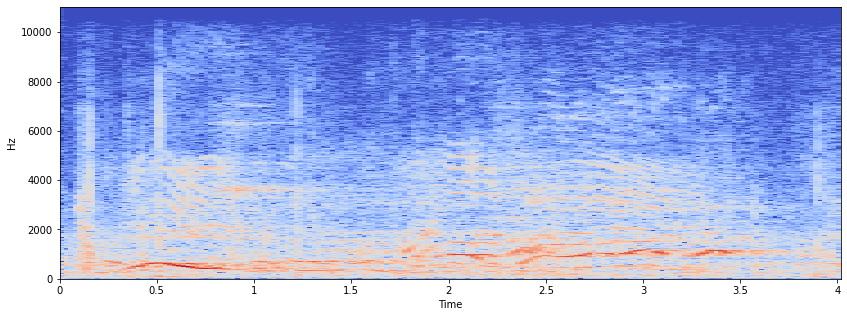

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

<h4>An Example of Drilling Sound With it's WavePlot and Spectrogram</h4>

In [ ]:
ipd.Audio('UrbanSound8K/audio/fold9/137815-4-0-0.wav')

<h4>Waveplot</h4>

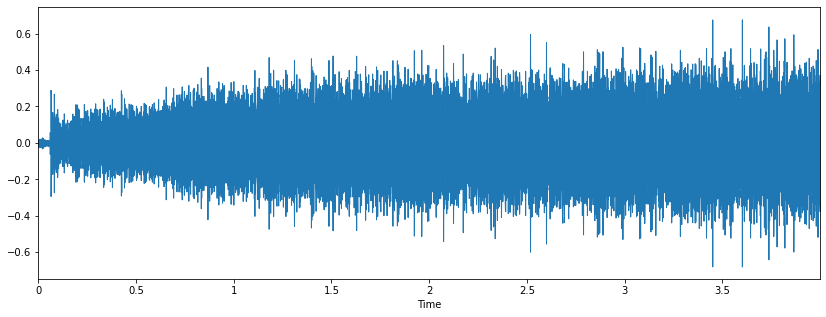

In [ ]:
x, sr = librosa.load('UrbanSound8K/audio/fold9/137815-4-0-0.wav')
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

<h4>Spectrogram</h4>

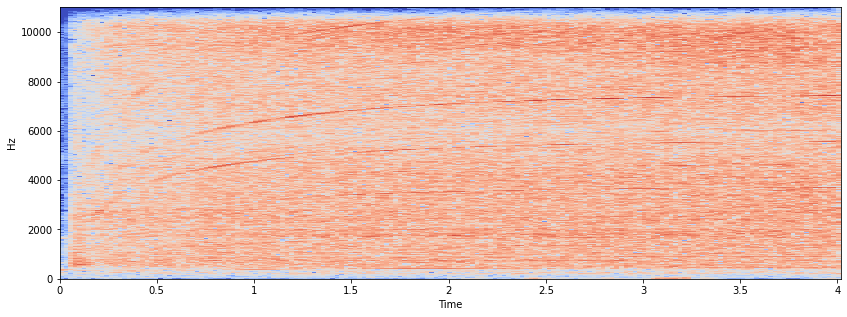

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.show()

Iterate over all samples in _valid_.
For every sample, construct the (128,128) spectrogram

In [ ]:
valid_data['path'] = 'fold' + valid_data['fold'].astype('str') + '/' + valid_data['slice_file_name'].astype('str')

In [ ]:
if not os.path.isfile('dataset.pickle'):
    D = [] # Dataset

    for row in valid_data.itertuples():
        y, sr = librosa.load('UrbanSound8K/audio/' + row.path, duration=2.97)
        ps = librosa.feature.melspectrogram(y=y, sr=sr)
        if ps.shape != (128, 128): continue
        D.append((ps, row.classID))
    with open('dataset.pickle', 'wb') as f:
        pickle.dump(D, f)
else:
    print("File Found....\nPlease Wait...")
    with open('dataset.pickle','rb') as f:
        D = pickle.load(f)
    print("File Succesfully Loaded")

In [ ]:
print("Number of samples: ", len(D))

Number of samples:  7467


In [ ]:
dataset = D
random.shuffle(dataset)

train = dataset[:7000]
test = dataset[7000:]

X_train, y_train = zip(*train)
X_test, y_test = zip(*test)

# Reshape for CNN input
X_train = np.array([x.reshape( (128, 128, 1) ) for x in X_train])
X_test = np.array([x.reshape( (128, 128, 1) ) for x in X_test])

# One-Hot encoding for classes
y_train = np.array(tensorflow.keras.utils.to_categorical(y_train, 10))
y_test = np.array(tensorflow.keras.utils.to_categorical(y_test, 10))

In [ ]:
model = Sequential()
input_shape=(128, 128, 1)

model.add(Conv2D(24, (5, 5), strides=(1, 1), input_shape=input_shape))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(Activation('relu'))

model.add(Flatten())
model.add(Dropout(rate=0.5))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

In [ ]:
model.compile(
    optimizer="Adam",
    loss="categorical_crossentropy",
    metrics=['accuracy'])
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(
    x=X_train,
    y=y_train,
    epochs=12,
    batch_size=128,
    validation_data= (X_test, y_test),callbacks=[tensorboard_callback])

score = model.evaluate(
    x=X_test,
    y=y_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/12
55/55 [==============================] - 105s 2s/step - loss: 3.0014 - accuracy: 0.1873 - val_loss: 2.1735 - val_accuracy: 0.2527
Epoch 2/12
55/55 [==============================] - 106s 2s/step - loss: 2.1550 - accuracy: 0.2247 - val_loss: 1.9531 - val_accuracy: 0.2976
Epoch 3/12
55/55 [==============================] - 105s 2s/step - loss: 1.9896 - accuracy: 0.2966 - val_loss: 1.8601 - val_accuracy: 0.3362
Epoch 4/12
55/55 [==============================] - 105s 2s/step - loss: 1.8397 - accuracy: 0.3483 - val_loss: 1.7692 - val_accuracy: 0.4090
Epoch 5/12
55/55 [==============================] - 105s 2s/step - loss: 1.7033 - accuracy: 0.4073 - val_loss: 1.6411 - val_accuracy: 0.4647
Epoch 6/12
55/55 [==============================] - 105s 2s/step - loss: 1.6580 - accuracy: 0.4244 - val_loss: 1.5484 - val_accuracy: 0.5118
Epoch 7/12
55/55 [==============================] - 106s 2s/step - loss: 1.5664 - accuracy: 0.4613 - val_loss: 1.4196 - val_accuracy: 0.5289
Epoch 8/12
55

In [ ]:
model.save('my_model.h5')

## Data Augmentation

### 1. Vary Time

In [ ]:
y, sr = librosa.load('UrbanSound8K/audio/fold1/14113-4-0-1.wav', duration=2.97)
y_changed = librosa.effects.time_stretch(y, rate=0.81)
librosa.output.write_wav('augmented/fold1/speed_81/14113-4-0-1.wav' ,y_changed, sr)

In [ ]:
rate = 1.07 # replace with 0.81 and execute again

for row in valid_data.itertuples():
    y, sr = librosa.load('UrbanSound8K/audio/' + row.path)
    y_changed = librosa.effects.time_stretch(y, rate=rate)
    librosa.output.write_wav('drive/My Drive/augmented/fold' + str(row.fold) + '/speed_' + str(int(rate*100)) + '/' + row.slice_file_name ,y_changed, sr)

In [ ]:
valid_data['path'] = 'content/drive/My Drive/augmented/fold' + valid_data['fold'].astype('str') + '/speed_107/' + valid_data['slice_file_name'].astype('str')

In [ ]:
if not os.path.isfile('content/drive/My Drive/dataset_vary_time.pickle'):
    D = [] # Dataset

    for row in valid_data.itertuples():
        y, sr = librosa.load(row.path, duration=2.97)
        ps = librosa.feature.melspectrogram(y=y, sr=sr)
        if ps.shape != (128, 128): continue
        D.append((ps, row.classID))
    with open('dataset_vary_time.pickle', 'wb') as f:
        pickle.dump(D, f)
else:
    print("File Found....\nPlease Wait...")
    with open('content/drive/My Drive/dataset_vary_time.pickle','rb') as f:
        D = pickle.load(f)
    print("File Succesfully Loaded")

In [ ]:
dataset = D
random.shuffle(dataset)

train = dataset[:7000]
test = dataset[7000:]

X_train, y_train = zip(*train)
X_test, y_test = zip(*test)

# Reshape for CNN input
X_train = np.array([x.reshape( (128, 128, 1) ) for x in X_train])
X_test = np.array([x.reshape( (128, 128, 1) ) for x in X_test])

# One-Hot encoding for classes
y_train = np.array(tensorflow.keras.utils.to_categorical(y_train, 10))
y_test = np.array(tensorflow.keras.utils.to_categorical(y_test, 10))

In [ ]:
model = Sequential()
input_shape=(128, 128, 1)

model.add(Conv2D(24, (5, 5), strides=(1, 1), input_shape=input_shape))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(Activation('relu'))

model.add(Flatten())
model.add(Dropout(rate=0.5))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

In [ ]:
model.compile(
    optimizer="Adam",
    loss="categorical_crossentropy",
    metrics=['accuracy'])
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(
    x=X_train,
    y=y_train,
    epochs=12,
    batch_size=128,
    validation_data= (X_test, y_test),callbacks=[tensorboard_callback])

score = model.evaluate(
    x=X_test,
    y=y_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/12
55/55 [==============================] - 105s 2s/step - loss: 2.6639 - accuracy: 0.1903 - val_loss: 2.2233 - val_accuracy: 0.2562
Epoch 2/12
55/55 [==============================] - 106s 2s/step - loss: 2.0989 - accuracy: 0.2307 - val_loss: 2.0148 - val_accuracy: 0.3311
Epoch 3/12
55/55 [==============================] - 105s 2s/step - loss: 1.9877 - accuracy: 0.2947 - val_loss: 1.8671 - val_accuracy: 0.3424
Epoch 4/12
55/55 [==============================] - 105s 2s/step - loss: 1.8277 - accuracy: 0.3464 - val_loss: 1.7113 - val_accuracy: 0.3878
Epoch 5/12
55/55 [==============================] - 108s 2s/step - loss: 1.6873 - accuracy: 0.3973 - val_loss: 1.6184 - val_accuracy: 0.4535
Epoch 6/12
55/55 [==============================] - 105s 2s/step - loss: 1.6720 - accuracy: 0.4051 - val_loss: 1.5504 - val_accuracy: 0.4762
Epoch 7/12
55/55 [==============================] - 105s 2s/step - loss: 1.5109 - accuracy: 0.4523 - val_loss: 1.3782 - val_accuracy: 0.5147
Epoch 8/12
55

### 2. Vary pitch

In [ ]:
n_steps = 2 #-1, -2, 2, 1

for row in valid_data.itertuples():
    y, sr = librosa.load('UrbanSound8K/audio/' + row.path)
    y_changed = librosa.effects.pitch_shift(y, sr, n_steps=n_steps)
    librosa.output.write_wav('drive/My Drive/augmented/fold' + str(row.fold) + '/ps1_' + str(int(n_steps)) + '/' + row.slice_file_name ,y_changed, sr)

In [ ]:
valid_data['path'] = 'content/drive/My Drive/augmented/fold' + valid_data['fold'].astype('str') + '/ps1_2/' + valid_data['slice_file_name'].astype('str')

In [ ]:
if not os.path.isfile('content/drive/My Drive/dataset_vary_pitch.pickle'):
    D = [] # Dataset

    for row in valid_data.itertuples():
        y, sr = librosa.load(row.path, duration=2.97)
        ps = librosa.feature.melspectrogram(y=y, sr=sr)
        if ps.shape != (128, 128): continue
        D.append((ps, row.classID))
    with open('dataset_vary_time.pickle', 'wb') as f:
        pickle.dump(D, f)
else:
    print("File Found....\nPlease Wait...")
    with open('content/drive/My Drive/dataset_vary_pitch.pickle','rb') as f:
        D = pickle.load(f)
    print("File Succesfully Loaded")

In [ ]:
model = Sequential()
input_shape=(128, 128, 1)

model.add(Conv2D(24, (5, 5), strides=(1, 1), input_shape=input_shape))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(Activation('relu'))

model.add(Flatten())
model.add(Dropout(rate=0.5))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

In [ ]:
model.compile(
    optimizer="Adam",
    loss="categorical_crossentropy",
    metrics=['accuracy'])
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(
    x=X_train,
    y=y_train,
    epochs=12,
    batch_size=128,
    validation_data= (X_test, y_test),callbacks=[tensorboard_callback])

score = model.evaluate(
    x=X_test,
    y=y_test)

print('Test loss#:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.1125425479028
Test accuracy: 0.6519729426483268


### 3. Change Pitch (PS2)

In [ ]:
n_steps = 2.5 #-2.5, -3.5, 2.5, 3.5

for row in valid_data.itertuples():
    y, sr = librosa.load('UrbanSound8K/audio/' + row.path)
    y_changed = librosa.effects.pitch_shift(y, sr, n_steps=n_steps)
    librosa.output.write_wav('code/augmented/fold' + str(row.fold) + '/ps2_m' + str(int(n_steps*10)) + '/' + row.slice_file_name ,y_changed, sr)

In [ ]:
valid_data['path'] = 'content/drive/My Drive/augmented/fold' + valid_data['fold'].astype('str') + '/ps2_m25/' + valid_data['slice_file_name'].astype('str')

In [ ]:
dataset = D
random.shuffle(dataset)

train = dataset[:35000]
test = dataset[35000:]

X_train, y_train = zip(*train)
X_test, y_test = zip(*test)

X_train = np.array([x.reshape( (128, 128, 1) ) for x in X_train])
X_test = np.array([x.reshape( (128, 128, 1) ) for x in X_test])

y_train = np.array(keras.utils.to_categorical(y_train, 10))
y_test = np.array(keras.utils.to_categorical(y_test, 10))

In [ ]:
model = Sequential()
input_shape=(128, 128, 1)

model.add(Conv2D(24, (5, 5), strides=(1, 1), input_shape=input_shape))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(MaxPooling2D((4, 2), strides=(4, 2)))
model.add(Activation('relu'))

model.add(Conv2D(48, (5, 5), padding="valid"))
model.add(Activation('relu'))

model.add(Flatten())
model.add(Dropout(rate=0.5))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

In [ ]:
model.compile(
    optimizer="Adam",
    loss="categorical_crossentropy",
        metrics=['accuracy'])

model.fit(
    x=X_train,
    y=y_train,
    epochs=12,
    batch_size=128,
    validation_data= (X_test, y_test),callbacks=[tensorboard_callback])

score = model.evaluate(
    x=X_test,
    y=y_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.4050511601247505
Test accuracy: 0.8257013571963591


# With data augmentation, we get upto $82\%$.

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>